In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import logging
import random
import tensorflow as tf
from tensorflow.keras.applications import VGG16, MobileNetV2, EfficientNetB0, ResNet50, InceptionV3, DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve, auc
import pandas as pd
import time
import pickle

In [2]:
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

In [3]:
# Define the dataset path with error handling
try:
    dataset_base_path = '../dataset'
    if not os.path.exists(dataset_base_path):
        raise FileNotFoundError(f"Dataset path '{dataset_base_path}' does not exist")
    
    dirs = os.listdir(dataset_base_path)
    print(f"Available directories: {dirs}")
except Exception as e:
    logger.error(f"Error loading dataset directory: {str(e)}")
    raise

Available directories: ['Apple', 'Bell Pepper', 'Cherry', 'Corn (Maize)', 'Grape', 'Peach', 'Potato', 'Strawberry', 'Tomato']


In [ ]:
PLANT_NAME = 'Tomato'

In [ ]:
# Select and validate the target directory
try:
    selected_dir = PLANT_NAME
    selected_dir_path = os.path.join(dataset_base_path, selected_dir)
    
    if not os.path.exists(selected_dir_path):
        raise FileNotFoundError(f"Selected directory '{selected_dir}' does not exist")
    
    # List all disease categories
    disease_categories = [d for d in os.listdir(selected_dir_path) 
                         if os.path.isdir(os.path.join(selected_dir_path, d))]
    
    print(f"Found {len(disease_categories)} disease categories: {disease_categories}")
except Exception as e:
    logger.error(f"Error accessing selected directory: {str(e)}")
    raise

Found 8 disease categories: ['Tomato Early blight leaf', 'Tomato leaf', 'Tomato leaf bacterial spot', 'Tomato leaf late blight', 'Tomato leaf mosaic virus', 'Tomato leaf yellow virus', 'Tomato mold leaf', 'Tomato Septoria leaf spot']


In [5]:
# Function to display sample images from each category
def display_sample_images(directory_path, categories, samples_per_category=3):
    """Display sample images from each category."""
    plt.figure(figsize=(15, 5 * len(categories)))
    
    for i, category in enumerate(categories):
        category_path = os.path.join(directory_path, category)
        image_files = os.listdir(category_path)
        
        # Select random samples
        sample_files = random.sample(image_files, min(samples_per_category, len(image_files)))
        
        for j, file in enumerate(sample_files):
            img_path = os.path.join(category_path, file)
            img = Image.open(img_path).convert('RGB')
            
            plt.subplot(len(categories), samples_per_category, i * samples_per_category + j + 1)
            plt.imshow(img)
            plt.title(f"{category}\n{img.size}")
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()

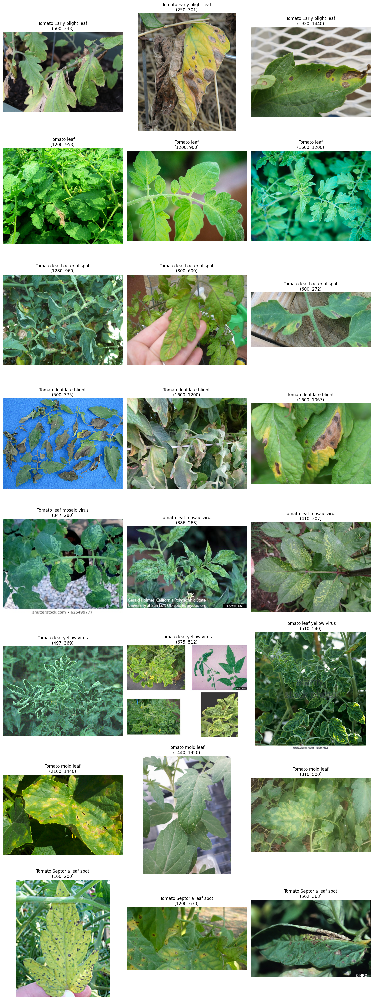

In [6]:
# Display sample images before preprocessing
try:
    display_sample_images(selected_dir_path, disease_categories)
except Exception as e:
    logger.error(f"Error displaying sample images: {str(e)}")

In [7]:
# Loading images and labels with validation and progress tracking
images = []
labels = []
image_paths = []  # Store paths for reference
target_size = (224, 224)

In [8]:
try:
    total_images = sum([len(os.listdir(os.path.join(selected_dir_path, label))) 
                       for label in disease_categories])
    processed_images = 0
    
    for label in disease_categories:
        label_path = os.path.join(selected_dir_path, label)
        
        if os.path.isdir(label_path):
            logger.info(f"Processing category: {label}")
            
            for img_name in os.listdir(label_path):
                processed_images += 1
                
                if processed_images % 100 == 0:
                    logger.info(f"Processed {processed_images}/{total_images} images")
                
                img_path = os.path.join(label_path, img_name)
                image_paths.append(img_path)
                
                try:
                    img = Image.open(img_path)
                    
                    # Check if the image is valid
                    if img.mode != 'RGB':
                        img = img.convert('RGB')
                    
                    # Resize the image
                    img = img.resize(target_size)
                    
                    # Normalize pixel values
                    img_array = np.array(img) / 255.0
                    
                    images.append(img_array)
                    labels.append(label)
                except Exception as img_error:
                    logger.warning(f"Error processing image {img_path}: {str(img_error)}")
                    continue
    
    # Convert to numpy arrays
    images = np.array(images)
    labels = np.array(labels)
    
    logger.info(f"Successfully loaded {len(images)} images with {len(np.unique(labels))} unique labels")
    print(f"Image array shape: {images.shape}")
    print(f"Labels: {np.unique(labels, return_counts=True)}")
except Exception as e:
    logger.error(f"Error in image loading process: {str(e)}")
    raise

2025-04-01 11:12:11,157 - INFO - Processing category: Tomato Early blight leaf
2025-04-01 11:12:12,453 - INFO - Processing category: Tomato leaf
2025-04-01 11:12:13,463 - INFO - Processed 100/662 images
2025-04-01 11:12:14,354 - INFO - Processing category: Tomato leaf bacterial spot
2025-04-01 11:12:15,750 - INFO - Processed 200/662 images
2025-04-01 11:12:16,184 - INFO - Processing category: Tomato leaf late blight
2025-04-01 11:12:18,321 - INFO - Processed 300/662 images
2025-04-01 11:12:19,070 - INFO - Processing category: Tomato leaf mosaic virus
2025-04-01 11:12:19,760 - INFO - Processing category: Tomato leaf yellow virus
2025-04-01 11:12:20,455 - INFO - Processed 400/662 images
2025-04-01 11:12:21,207 - INFO - Processing category: Tomato mold leaf
2025-04-01 11:12:22,899 - INFO - Processed 500/662 images
2025-04-01 11:12:23,391 - INFO - Processing category: Tomato Septoria leaf spot
2025-04-01 11:12:24,961 - INFO - Processed 600/662 images
2025-04-01 11:12:26,648 - INFO - Succes

Image array shape: (662, 224, 224, 3)
Labels: (array(['Tomato Early blight leaf', 'Tomato Septoria leaf spot',
       'Tomato leaf', 'Tomato leaf bacterial spot',
       'Tomato leaf late blight', 'Tomato leaf mosaic virus',
       'Tomato leaf yellow virus', 'Tomato mold leaf'], dtype='<U26'), array([ 74, 137,  54,  98, 101,  44,  69,  85], dtype=int64))


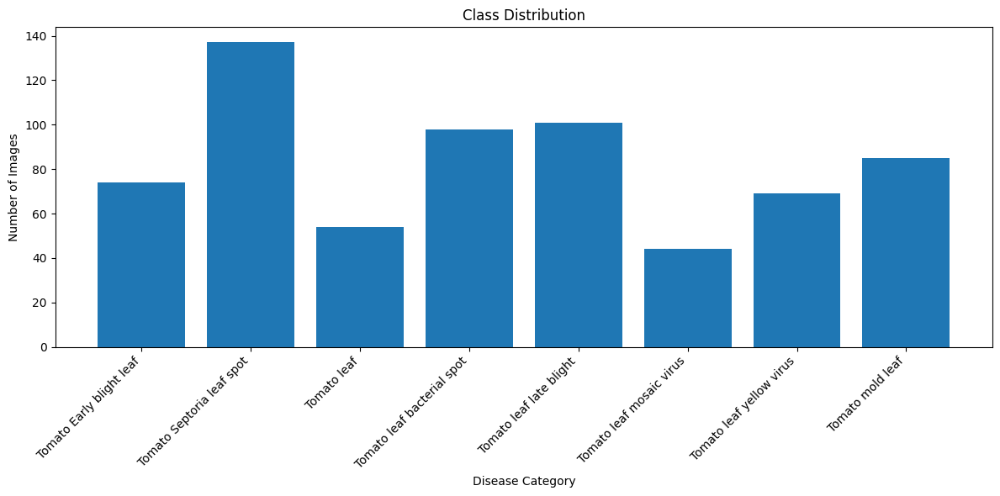

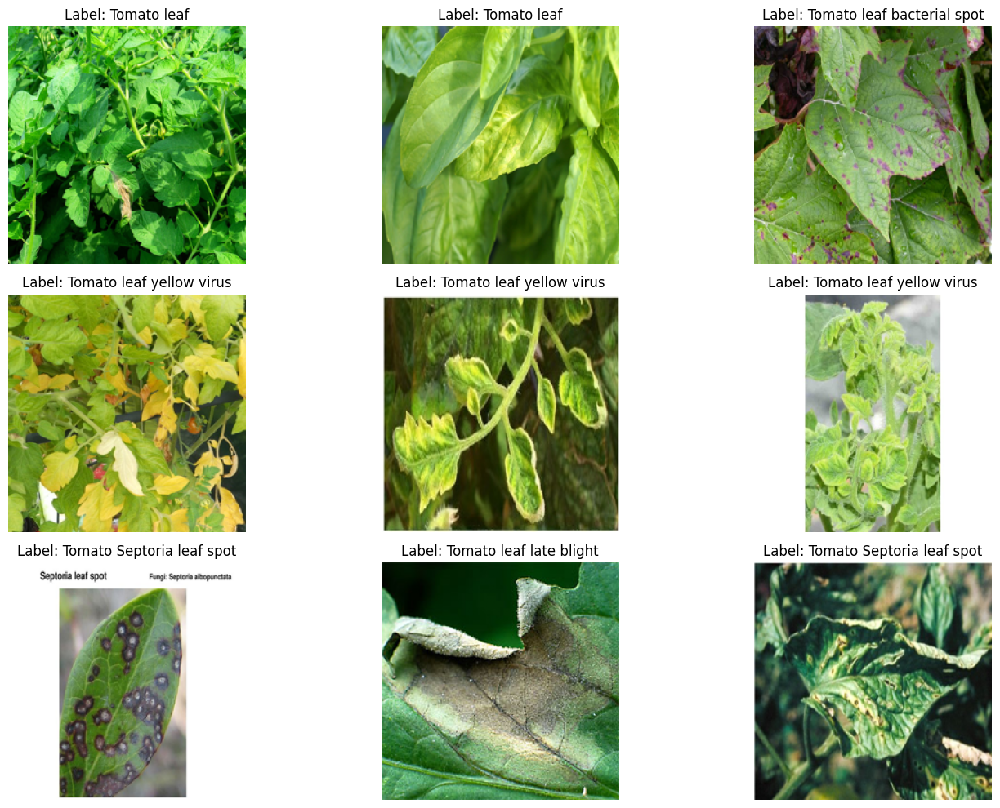

Image shape: (224, 224, 3)
Pixel value range: 0.0 to 1.0


In [9]:
# Display data distribution
try:
    # Plot class distribution
    plt.figure(figsize=(12, 6))
    label_counts = np.unique(labels, return_counts=True)
    plt.bar(label_counts[0], label_counts[1])
    plt.title('Class Distribution')
    plt.xlabel('Disease Category')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Display random processed images
    plt.figure(figsize=(15, 10))
    for i in range(9):
        idx = random.randint(0, len(images) - 1)
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[idx])
        plt.title(f"Label: {labels[idx]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Display image statistics
    print(f"Image shape: {images[0].shape}")
    print(f"Pixel value range: {images.min()} to {images.max()}")
except Exception as e:
    logger.error(f"Error during data validation visualization: {str(e)}")


In [10]:
# Split the dataset with validation
try:
    X_train, X_test, y_train, y_test = train_test_split(
        images, labels, test_size=0.2, random_state=42, stratify=labels
    )
    
    # Verify the split
    print(f"Training set shape: {X_train.shape}")
    print(f"Test set shape: {X_test.shape}")
    print("")
    print(f"Training classes distribution: {np.unique(y_train, return_counts=True)}")
    print(f"Test classes distribution: {np.unique(y_test, return_counts=True)}")
    
    # Calculate and display memory usage
    def get_size_in_mb(arr):
        """Calculate the size of a numpy array in MB."""
        return arr.nbytes / (1024 * 1024)
    
    print(f"\n\nMemory usage - Training data: {get_size_in_mb(X_train):.2f} MB")
    print(f"Memory usage - Test data: {get_size_in_mb(X_test):.2f} MB")
    print(f"Total memory usage: {get_size_in_mb(images):.2f} MB")
except Exception as e:
    logger.error(f"Error during train-test split: {str(e)}")
    raise


Training set shape: (529, 224, 224, 3)
Test set shape: (133, 224, 224, 3)

Training classes distribution: (array(['Tomato Early blight leaf', 'Tomato Septoria leaf spot',
       'Tomato leaf', 'Tomato leaf bacterial spot',
       'Tomato leaf late blight', 'Tomato leaf mosaic virus',
       'Tomato leaf yellow virus', 'Tomato mold leaf'], dtype='<U26'), array([ 59, 110,  43,  78,  81,  35,  55,  68], dtype=int64))
Test classes distribution: (array(['Tomato Early blight leaf', 'Tomato Septoria leaf spot',
       'Tomato leaf', 'Tomato leaf bacterial spot',
       'Tomato leaf late blight', 'Tomato leaf mosaic virus',
       'Tomato leaf yellow virus', 'Tomato mold leaf'], dtype='<U26'), array([15, 27, 11, 20, 20,  9, 14, 17], dtype=int64))


Memory usage - Training data: 607.52 MB
Memory usage - Test data: 152.74 MB
Total memory usage: 760.27 MB


In [ ]:
# Ensure TensorFlow uses GPU if available
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Function to create a model using transfer learning
def create_model(base_model_name, input_shape, num_classes, dropout_rate=0.3):
    """
    Create a transfer learning model based on the specified architecture
    
    Args:
        base_model_name: Name of the base model to use
        input_shape: Shape of input images
        num_classes: Number of output classes
        dropout_rate: Dropout rate for regularization
        
    Returns:
        Model: Compiled keras model
    """
    if base_model_name == 'VGG16':
        base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    elif base_model_name == 'MobileNetV2':
        base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    elif base_model_name == 'EfficientNetB0':
        base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
    elif base_model_name == 'ResNet50':
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif base_model_name == 'InceptionV3':
        base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    elif base_model_name == 'DenseNet121':
        base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
    else:
        raise ValueError(f"Unsupported model: {base_model_name}")
    
    # We'll freeze the base model layers
    base_model.trainable = False

    ## unfreeze the last few layers of the base model
    # for layer in base_model.layers[-5:]:
    #     layer.trainable = True
    
    # Add a global spatial average pooling layer
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    
    # Add a fully-connected layer
    x = Dense(1024, activation='relu')(x)
    x = Dropout(dropout_rate)(x)
    
    # Add a logistic layer for predictions
    if num_classes == 2:
        predictions = Dense(1, activation='sigmoid')(x)
    else:
        predictions = Dense(num_classes, activation='softmax')(x)
    
    # Final model
    model = Model(inputs=base_model.input, outputs=predictions)
    
    return model

# Function to train a model and evaluate its performance
def train_and_evaluate_model(model_name, X_train, y_train, X_test, y_test, num_classes, 
                            epochs=15, batch_size=32, learning_rate=0.001,
                            save_dir='saved_models'):
    """
    Train and evaluate a model
    
    Args:
        model_name: Name of the model architecture
        X_train, y_train: Training data
        X_test, y_test: Test data
        num_classes: Number of output classes
        epochs: Maximum number of epochs to train
        batch_size: Batch size for training
        learning_rate: Initial learning rate
        save_dir: Directory to save the trained model
        
    Returns:
        dict: Dictionary containing evaluation metrics
    """
    print(f"\n{'-'*50}")
    print(f"Training {model_name}")
    print(f"{'-'*50}")
    
    # Create model
    model = create_model(model_name, X_train.shape[1:], num_classes)
    
    # Compile model
    if num_classes == 2:
        model.compile(optimizer=Adam(learning_rate=learning_rate),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])
    else:
        model.compile(optimizer=Adam(learning_rate=learning_rate),
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])
    
    # Define callbacks
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
        
    model_checkpoint = ModelCheckpoint(
        filepath=os.path.join(save_dir, f"{model_name}.keras"),
        monitor='val_accuracy',
        mode='max',
        save_best_only=True,
        verbose=1
    )
    
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        verbose=1
    )
    
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-6,
        verbose=1
    )
    
    # Data augmentation for training
    datagen = ImageDataGenerator(
        rotation_range=5,
        width_shift_range=0.05,
        height_shift_range=0.05,
        horizontal_flip=True,
        zoom_range=0.05
    )
    datagen.fit(X_train)
    
    # Measure training time
    start_time = time.time()
    
    # Train the model
    history = model.fit(
        datagen.flow(X_train, y_train, batch_size=batch_size),
        epochs=epochs,
        validation_data=(X_test, y_test),
        callbacks=[model_checkpoint, early_stopping, reduce_lr]
    )
    
    training_time = time.time() - start_time
    
    # Load the best model
    model.load_weights(os.path.join(save_dir, f"{model_name}.keras"))
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X_test)
    inference_time = (time.time() - start_time) / len(X_test)
    
    # Convert predictions to class labels
    if num_classes == 2:
        y_pred = (predictions > 0.5).astype("int32").flatten()
    else:
        y_pred = np.argmax(predictions, axis=1)
    
    # Calculate metrics
    metrics = {}
    metrics['model_name'] = model_name
    metrics['accuracy'] = (y_pred == y_test).mean()
    
    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    metrics['precision'] = report['weighted avg']['precision']
    metrics['recall'] = report['weighted avg']['recall']
    metrics['f1_score'] = report['weighted avg']['f1-score']
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    metrics['confusion_matrix'] = cm
    
    # ROC curve and AUC for binary classification
    if num_classes == 2:
        fpr, tpr, _ = roc_curve(y_test, predictions)
        metrics['roc_auc'] = auc(fpr, tpr)
        metrics['fpr'] = fpr
        metrics['tpr'] = tpr
    else:
        # For multiclass, calculate ROC AUC using one-vs-rest approach
        metrics['roc_auc'] = []
        for i in range(num_classes):
            y_true_binary = (y_test == i).astype(int)
            if predictions.ndim > 1 and predictions.shape[1] > 1:
                y_score = predictions[:, i]
            else:
                y_score = predictions
            fpr, tpr, _ = roc_curve(y_true_binary, y_score)
            metrics['roc_auc'].append(auc(fpr, tpr))
        metrics['roc_auc'] = np.mean(metrics['roc_auc'])
    
    # Training history
    metrics['history'] = history.history
    
    # Model size
    model_size_mb = os.path.getsize(os.path.join(save_dir, f"{model_name}.keras")) / (1024 * 1024)
    metrics['model_size_mb'] = model_size_mb
    
    # Training and inference time
    metrics['training_time'] = training_time
    metrics['inference_time'] = inference_time * 1000  # Convert to milliseconds
    
    # Save the model in a separate format for easy loading
    model.save(os.path.join(save_dir, f"{model_name}_final.keras"))
    
    # Print key metrics
    print(f"\n{model_name} Evaluation:")
    print(f"Accuracy: {metrics['accuracy']:.4f}")
    print(f"Precision: {metrics['precision']:.4f}")
    print(f"Recall: {metrics['recall']:.4f}")
    print(f"F1 Score: {metrics['f1_score']:.4f}")
    print(f"ROC AUC: {metrics['roc_auc']:.4f}")
    print(f"Model Size: {metrics['model_size_mb']:.2f} MB")
    print(f"Training Time: {metrics['training_time']:.2f} seconds")
    print(f"Inference Time: {metrics['inference_time']:.2f} ms per sample")
    
    return metrics, model

# Function to plot training history
def plot_training_history(history, model_name):
    """
    Plot training and validation accuracy/loss
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axes[0].plot(history['accuracy'], label='Training Accuracy')
    axes[0].plot(history['val_accuracy'], label='Validation Accuracy')
    axes[0].set_title(f'{model_name} - Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    
    # Loss plot
    axes[1].plot(history['loss'], label='Training Loss')
    axes[1].plot(history['val_loss'], label='Validation Loss')
    axes[1].set_title(f'{model_name} - Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    
    plt.tight_layout()
    return fig

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr, roc_auc, model_name):
    """
    Plot ROC curve for binary classification
    """
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.3f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} - ROC Curve')
    plt.legend(loc="lower right")
    return plt.gcf()

# Function to plot confusion matrix
def plot_confusion_matrix(cm, model_name, num_classes):
    """
    Plot confusion matrix
    """
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=range(num_classes), 
                yticklabels=range(num_classes))
    plt.title(f'{model_name} - Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    return plt.gcf()

# Main function to train and evaluate multiple models
def evaluate_multiple_models(X_train, y_train, X_test, y_test, num_classes, 
                           save_dir='saved_models', visualizations_dir='visualizations'):
    """
    Train and evaluate multiple CNN models
    
    Args:
        X_train, y_train: Training data
        X_test, y_test: Test data
        num_classes: Number of output classes
        save_dir: Directory to save models
        visualizations_dir: Directory to save visualizations
    """
    # Create directories if they don't exist
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    if not os.path.exists(visualizations_dir):
        os.makedirs(visualizations_dir)
    
    # Model configurations to try
    model_configs = [
        {'name': 'VGG16', 'epochs': 4, 'batch_size': 32, 'learning_rate': 0.001},
        {'name': 'MobileNetV2', 'epochs': 4, 'batch_size': 32, 'learning_rate': 0.001},
        {'name': 'EfficientNetB0', 'epochs': 4, 'batch_size': 32, 'learning_rate': 0.001},
        {'name': 'ResNet50', 'epochs': 4, 'batch_size': 32, 'learning_rate': 0.001},
        {'name': 'InceptionV3', 'epochs': 4, 'batch_size': 32, 'learning_rate': 0.001},
        {'name': 'DenseNet121', 'epochs': 4, 'batch_size': 32, 'learning_rate': 0.001}
    ]
    
    all_metrics = []
    best_model = None
    best_accuracy = 0
    
    # Train and evaluate each model
    for config in model_configs:
        metrics, model = train_and_evaluate_model(
            model_name=config['name'],
            X_train=X_train,
            y_train=y_train,
            X_test=X_test,
            y_test=y_test,
            num_classes=num_classes,
            epochs=config['epochs'],
            batch_size=config['batch_size'],
            learning_rate=config['learning_rate'],
            save_dir=save_dir
        )
        
        all_metrics.append(metrics)
        
        # Save visualizations
        # Training history
        fig_history = plot_training_history(metrics['history'], config['name'])
        fig_history.savefig(os.path.join(visualizations_dir, f"{config['name']}_history.png"))
        
        # Confusion matrix
        fig_cm = plot_confusion_matrix(metrics['confusion_matrix'], config['name'], num_classes)
        fig_cm.savefig(os.path.join(visualizations_dir, f"{config['name']}_confusion_matrix.png"))
        
        # ROC curve for binary classification
        if num_classes == 2:
            fig_roc = plot_roc_curve(metrics['fpr'], metrics['tpr'], metrics['roc_auc'], config['name'])
            fig_roc.savefig(os.path.join(visualizations_dir, f"{config['name']}_roc_curve.png"))
        
        plt.close('all')
        
        # Keep track of the best model
        if metrics['accuracy'] > best_accuracy:
            best_accuracy = metrics['accuracy']
            best_model = {'name': config['name'], 'model': model}
    
    # Save the best model
    if best_model:
        best_model_name = best_model['name']
        best_model['model'].save(os.path.join(save_dir, f"{best_model_name}_best.keras"))
        print(f"\nBest performing model: {best_model_name} with accuracy {best_accuracy:.4f}")
    
    # Create comparison table
    comparison_df = pd.DataFrame([{
        'Model': m['model_name'],
        'Accuracy': m['accuracy'],
        'Precision': m['precision'],
        'Recall': m['recall'],
        'F1 Score': m['f1_score'],
        'ROC AUC': m['roc_auc'],
        'Model Size (MB)': m['model_size_mb'],
        'Training Time (s)': m['training_time'],
        'Inference Time (ms)': m['inference_time']
    } for m in all_metrics])
    
    # Save comparison table
    comparison_df.to_csv(os.path.join(save_dir, 'model_comparison.csv'), index=False)
    
    # Save all metrics for later analysis
    with open(os.path.join(save_dir, 'all_metrics.pkl'), 'wb') as f:
        pickle.dump(all_metrics, f)
    
    return comparison_df, all_metrics

# Plot comparison bar charts
def plot_comparison_charts(comparison_df, save_dir='visualizations'):
    """
    Create bar charts comparing the performance of different models
    """
    metrics_to_plot = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC']
    
    # Performance metrics comparison
    plt.figure(figsize=(15, 8))
    comparison_df[['Model'] + metrics_to_plot].set_index('Model').plot(kind='bar', width=0.8)
    plt.title('Model Performance Comparison')
    plt.ylabel('Score')
    plt.ylim(0, 1)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'performance_comparison.png'))
    
    # Resource usage comparison
    plt.figure(figsize=(15, 8))
    
    # Normalize model size and inference time for better visualization
    size_norm = comparison_df['Model Size (MB)'] / comparison_df['Model Size (MB)'].max()
    time_norm = comparison_df['Inference Time (ms)'] / comparison_df['Inference Time (ms)'].max()
    
    df_resource = pd.DataFrame({
        'Model': comparison_df['Model'],
        'Normalized Model Size': size_norm,
        'Normalized Inference Time': time_norm
    })
    
    df_resource.set_index('Model').plot(kind='bar', width=0.8)
    plt.title('Model Resource Usage Comparison (Normalized)')
    plt.ylabel('Normalized Value')
    plt.ylim(0, 1.1)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'resource_comparison.png'))
    
    plt.close('all')

In [ ]:
# Create and fit the label encoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Save the label mapping for future reference
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label mapping:")
for class_name, class_id in label_mapping.items():
    print(f"  {class_name} -> {class_id}")

# Now run the evaluation with encoded labels
comparison_df, all_metrics = evaluate_multiple_models(
    X_train=X_train, 
    y_train=y_train_encoded,  # Using encoded labels
    X_test=X_test, 
    y_test=y_test_encoded,    # Using encoded labels
    num_classes=len(np.unique(y_train)),
)

# Plot comparison charts
plot_comparison_charts(comparison_df)

# Print the comparison table
print("\nModel Comparison:")
print(comparison_df.to_string(index=False))

Label mapping:
  Tomato Early blight leaf -> 0
  Tomato Septoria leaf spot -> 1
  Tomato leaf -> 2
  Tomato leaf bacterial spot -> 3
  Tomato leaf late blight -> 4
  Tomato leaf mosaic virus -> 5
  Tomato leaf yellow virus -> 6
  Tomato mold leaf -> 7

--------------------------------------------------
Training VGG16
--------------------------------------------------
Epoch 1/4


c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.1812 - loss: 2.1412
Epoch 1: val_accuracy improved from -inf to 0.27068, saving model to saved_models\VGG16.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 95s 5s/step - accuracy: 0.1815 - loss: 2.1377 - val_accuracy: 0.2707 - val_loss: 1.9349 - learning_rate: 0.0010
Epoch 2/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.2675 - loss: 1.8731
Epoch 2: val_accuracy improved from 0.27068 to 0.33083, saving model to saved_models\VGG16.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.2682 - loss: 1.8722 - val_accuracy: 0.3308 - val_loss: 1.8379 - learning_rate: 0.0010
Epoch 3/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3377 - loss: 1.7306
Epoch 3: val_accuracy did not improve from 0.33083
17/17 ━━━━━━━━━━━━━━━━━━━━ 76s 4s/step - accuracy: 0.3366 - loss: 1.7323 - val_accuracy: 0.2556 - val_loss: 1.8188 - learning_rate: 0.0010
Epoch 4/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3643 - loss: 1.6880
Epoch 4: val_accuracy d

c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av


VGG16 Evaluation:
Accuracy: 0.3308
Precision: 0.3240
Recall: 0.3308
F1 Score: 0.2404
ROC AUC: 0.7106
Model Size: 62.32 MB
Training Time: 344.83 seconds
Inference Time: 143.07 ms per sample

--------------------------------------------------
Training MobileNetV2
--------------------------------------------------
Epoch 1/4


c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step - accuracy: 0.2133 - loss: 2.6342
Epoch 1: val_accuracy improved from -inf to 0.36842, saving model to saved_models\MobileNetV2.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 19s 735ms/step - accuracy: 0.2175 - loss: 2.6198 - val_accuracy: 0.3684 - val_loss: 1.5928 - learning_rate: 0.0010
Epoch 2/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 510ms/step - accuracy: 0.5203 - loss: 1.3835
Epoch 2: val_accuracy improved from 0.36842 to 0.43609, saving model to saved_models\MobileNetV2.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 657ms/step - accuracy: 0.5206 - loss: 1.3796 - val_accuracy: 0.4361 - val_loss: 1.4903 - learning_rate: 0.0010
Epoch 3/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.6879 - loss: 1.0076
Epoch 3: val_accuracy improved from 0.43609 to 0.47368, saving model to saved_models\MobileNetV2.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 705ms/step - accuracy: 0.6867 - loss: 1.0091 - val_accuracy: 0.4737 - val_loss: 1.4782 - learning_rate: 0.0010
Epoch 4/4
17/17 ━━━━━━━

c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 634ms/step - accuracy: 0.1710 - loss: 2.0703
Epoch 1: val_accuracy improved from -inf to 0.20301, saving model to saved_models\EfficientNetB0.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 30s 985ms/step - accuracy: 0.1717 - loss: 2.0699 - val_accuracy: 0.2030 - val_loss: 2.0306 - learning_rate: 0.0010
Epoch 2/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - accuracy: 0.2236 - loss: 2.0373
Epoch 2: val_accuracy did not improve from 0.20301
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 815ms/step - accuracy: 0.2227 - loss: 2.0377 - val_accuracy: 0.2030 - val_loss: 2.0311 - learning_rate: 0.0010
Epoch 3/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 671ms/step - accuracy: 0.1913 - loss: 1.9995
Epoch 3: val_accuracy did not improve from 0.20301
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 831ms/step - accuracy: 0.1911 - loss: 2.0015 - val_accuracy: 0.2030 - val_loss: 2.0351 - learning_rate: 0.0010
Epoch 4/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 626ms/step - accuracy: 0.1963 - loss: 2.0335
Epoch 4: val_accuracy did not improve f

2025-04-01 11:41:28,936 - WARNING - 5 out of the last 11 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000001F07CA616C0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 549ms/step

2025-04-01 11:41:32,759 - WARNING - 5 out of the last 11 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000001F07CA616C0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 956ms/step


c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av


EfficientNetB0 Evaluation:
Accuracy: 0.1504
Precision: 0.0226
Recall: 0.1504
F1 Score: 0.0393
ROC AUC: 0.5269
Model Size: 31.34 MB
Training Time: 77.68 seconds
Inference Time: 46.14 ms per sample

--------------------------------------------------
Training ResNet50
--------------------------------------------------
Epoch 1/4


c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1361 - loss: 2.4831
Epoch 1: val_accuracy improved from -inf to 0.06767, saving model to saved_models\ResNet50.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.1368 - loss: 2.4772 - val_accuracy: 0.0677 - val_loss: 2.2107 - learning_rate: 0.0010
Epoch 2/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1106 - loss: 2.2275
Epoch 2: val_accuracy improved from 0.06767 to 0.16541, saving model to saved_models\ResNet50.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.1125 - loss: 2.2243 - val_accuracy: 0.1654 - val_loss: 2.0729 - learning_rate: 0.0010
Epoch 3/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1665 - loss: 2.1052
Epoch 3: val_accuracy improved from 0.16541 to 0.19549, saving model to saved_models\ResNet50.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.1673 - loss: 2.1043 - val_accuracy: 0.1955 - val_loss: 2.0027 - learning_rate: 0.0010
Epoch 4/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - 

c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av


ResNet50 Evaluation:
Accuracy: 0.2105
Precision: 0.1419
Recall: 0.2105
F1 Score: 0.1359
ROC AUC: 0.5653
Model Size: 114.69 MB
Training Time: 182.95 seconds
Inference Time: 68.81 ms per sample

--------------------------------------------------
Training InceptionV3
--------------------------------------------------
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step
Epoch 1/4


c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 826ms/step - accuracy: 0.1780 - loss: 3.4444
Epoch 1: val_accuracy improved from -inf to 0.30827, saving model to saved_models\InceptionV3.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.1808 - loss: 3.4270 - val_accuracy: 0.3083 - val_loss: 2.0271 - learning_rate: 0.0010
Epoch 2/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 854ms/step - accuracy: 0.3981 - loss: 1.6945
Epoch 2: val_accuracy improved from 0.30827 to 0.34586, saving model to saved_models\InceptionV3.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.3992 - loss: 1.6905 - val_accuracy: 0.3459 - val_loss: 1.7603 - learning_rate: 0.0010
Epoch 3/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 850ms/step - accuracy: 0.4469 - loss: 1.4715
Epoch 3: val_accuracy improved from 0.34586 to 0.42857, saving model to saved_models\InceptionV3.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.4484 - loss: 1.4685 - val_accuracy: 0.4286 - val_loss: 1.5763 - learning_rate: 0.0010
Epoch 4/4
17/17 ━━━━━━━━━━━━━━━━

c:\Users\Akhil PC\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2178 - loss: 2.2436
Epoch 1: val_accuracy improved from -inf to 0.33835, saving model to saved_models\DenseNet121.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 62s 3s/step - accuracy: 0.2202 - loss: 2.2361 - val_accuracy: 0.3383 - val_loss: 1.8053 - learning_rate: 0.0010
Epoch 2/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3863 - loss: 1.6130
Epoch 2: val_accuracy improved from 0.33835 to 0.42105, saving model to saved_models\DenseNet121.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.3880 - loss: 1.6089 - val_accuracy: 0.4211 - val_loss: 1.5908 - learning_rate: 0.0010
Epoch 3/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5123 - loss: 1.3517
Epoch 3: val_accuracy improved from 0.42105 to 0.48120, saving model to saved_models\DenseNet121.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.5118 - loss: 1.3520 - val_accuracy: 0.4812 - val_loss: 1.5178 - learning_rate: 0.0010
Epoch 4/4
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2